# ***Imports***

In [2]:
!pip install structure-tensor

  Preparing metadata (setup.py) ... done
  Created wheel for structure-tensor: filename=structure_tensor-0.2.0-py3-none-any.whl size=15898 sha256=da8dad9603640283f4a2381044e5bf6b5a93c4c89b7945304339fa6c81165f95
  Stored in directory: /root/.cache/pip/wheels/52/15/44/a79a269eb2f162711ce8de99cbeb64083bf51465df52663cfc
Successfully built structure-tensor


In [3]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy import ndimage
from numpy.linalg import norm
from math import floor, pi, exp, ceil
from numpy.linalg import eig
import scipy
from structure_tensor import eig_special_2d, structure_tensor_2d

# ***Functions***

## Old - Not Used

---



### Structure Tensor

In [4]:
def GetStructureTensor(pic,Smoothed,sigmaC):
  #print(pic)
  height,width = pic.shape[0],pic.shape[1]
  # Split Channels

  L,A,B = cv2.split(pic)


  # Calculate gradient_x, gradient_y for each channel
  # G (Gradient) x (Horizontal, Vertical) L,A,B (Channel Name)

  GxL = cv2.Sobel(L, -1, 1, 0, ksize=3)
  GxA = cv2.Sobel(A, -1, 1, 0, ksize=3)
  GxB = cv2.Sobel(B, -1, 1, 0, ksize=3)

  GyL = cv2.Sobel(L,-1, 0, 1, ksize=3)
  GyA = cv2.Sobel(A, -1, 0, 1, ksize=3)
  GyB = cv2.Sobel(B, -1, 0, 1, ksize=3)

  Gx_Full = GxL**2 + GxA**2 + GxB**2
  Gy_Full = GyL**2 + GyA**2 + GyB**2

  #print(L)
  #print(GxA)
  #print(GxB)

  S = np.zeros((height,width,3),dtype='float32')


  for x in range(height):
    for y in range(width):
      S[x,y,0] = GxL[x,y]**2
      S[x,y,1] = GxL[x,y] * GyL[x,y]
      S[x,y,2] = GyL[x,y] * GyL[x,y]


  kSize = max(1.0, floor(sigmaC * 2))
  if kSize % 2 == 0:
    kSize += 1

  S = cv2.GaussianBlur(S,(kSize,kSize),sigmaC)


  return S

In [5]:
def Mystructure_tensor_2d(image, sigma, rho, out=None, truncate=4.0):

    # Make sure it's a Numpy array.
    image = np.asarray(image)

    # Check data type. Must be floating point.
    if not np.issubdtype(image.dtype, np.floating):
        logging.warning('image is not floating type array. This may result in a loss of precision and unexpected behavior.')

    IxL = ndimage.gaussian_filter(image[:,:,0], sigma, order=[1, 0], mode='nearest', truncate=truncate)
    IxA = ndimage.gaussian_filter(image[:,:,1], sigma, order=[1, 0], mode='nearest', truncate=truncate)
    IxB = ndimage.gaussian_filter(image[:,:,2], sigma, order=[1, 0], mode='nearest', truncate=truncate)

    IyL = ndimage.gaussian_filter(image[:,:,0], sigma, order=[0, 1], mode='nearest', truncate=truncate)
    IyA = ndimage.gaussian_filter(image[:,:,1], sigma, order=[0, 1], mode='nearest', truncate=truncate)
    IyB = ndimage.gaussian_filter(image[:,:,2], sigma, order=[0, 1], mode='nearest', truncate=truncate)

    # Compute derivatives (Scipy implementation truncates filter at 4 sigma).
    Ix = IxL + IxA + IxB
    Iy = IyL + IyA + IyB
    if out is None:
        # Allocate S.
        S = np.empty((3,image.shape[0],image.shape[1]), dtype=image.dtype)
    else:
        # S is already allocated. We assume the size is correct.
        S = out

    # Integrate elements of structure tensor (Scipy uses sequence of 1D).
    tmp = np.empty((image.shape[0],image.shape[1]), dtype=image.dtype)
    np.multiply(Ix, Ix, out=tmp)
    ndimage.gaussian_filter(tmp, rho, mode='nearest', output=S[0], truncate=truncate)
    np.multiply(Iy, Iy, out=tmp)
    ndimage.gaussian_filter(tmp, rho, mode='nearest', output=S[1], truncate=truncate)
    np.multiply(Ix, Iy, out=tmp)
    ndimage.gaussian_filter(tmp, rho, mode='nearest', output=S[2], truncate=truncate)

    return S

### Gaussian Slow

In [6]:
import copy
def GaussInDirection(og_img,v2,sigma,K):
  height,width = og_img.shape[0],og_img.shape[1]
  result_img = np.zeros((height,width))
  kernelSize = floor(sigma * 2) if (sigma * 2 ) > 1 else 1
  for x in range(height):
    for y in range(width):
      dir = v2[x,y].copy()

      tmp = dir[0].copy()
      dir[0] = -1 * dir[1]
      dir[1] = tmp

      dirAbs = np.abs(dir)
      dir_step = 1.0 / (dirAbs[0] if dirAbs[0] > dirAbs[1] else dirAbs[1])


      currPixel = og_img[x,y].copy()
      kernelsum = 1.0

      # Start Loop
      #print(kernelSize)

      for dir_step in np.arange(dir_step,kernelSize + 1,dir_step):
        gauss = gaussian(sigma * K,dir_step)

        new_x = int(x - dir_step * dir[0])
        new_y = int(y - dir_step * dir[1])

        try:
          c1 = og_img[new_x,new_y].copy()
        except IndexError:
          continue

        new_x2 = int(x + dir_step * dir[0])
        new_y2 = int(y + dir_step * dir[1])

        try:
          c2 = og_img[new_x2,new_y2].copy()
        except IndexError:
          continue

        currPixel += gauss * (c1 + c2 )
        kernelsum += 2.0 * gauss

      currPixel /= kernelsum

      result_img[x,y] = currPixel.copy()

  return result_img

In [7]:
def step(s,v2):
  try:
    t = v2[int(s.p[0]),int(s.p[1])]
  except IndexError:
    s.w += 0.5
    return
  if np.dot(t,s.t) < 0.0:
    t = -t
  s.t = t
  if np.abs(t[0]) > np.abs(t[1]):
    s.dw = np.abs((frac(s.p[0]) - 0.5 - sign(t[0])) / t[0])
  else:
    s.dw = np.abs((frac(s.p[1]) - 0.5 - sign(t[1])) / t[1])
  if s.dw == 0:
    s.dw = 0.5
  s.p += t * s.dw

  s.w += s.dw

In [8]:
class lic_t():
    def __init__(self, p, t, w, dw):
        self.p = p # current position
        self.t = t # prev tangent
        self.w = w # total length
        self.dw = dw # len of current step

In [9]:
def GaussianSlowSecondPass(DoG,v2,sigmaM):
  kernelSize = floor(sigmaM * 2)
  Result = np.zeros((height,width),dtype='float32')
  twoSigmaM = 2.0 * sigmaM * sigmaM
  for x in range(height):
    for y in range(width):
      H = DoG[x,y]
      w = 1.0

      a = lic_t([x,y],v2[x,y],0,0)
      b = lic_t([x,y],-v2[x,y],0,0)
      #print("HNA")
      while a.w < kernelSize:
        step(a,v2)
        k = a.dw * gaussian(sigmaM,a.w)
        try:
          H += k * DoG[int(a.p[0]),int(a.p[1])]
        except IndexError:
          continue
        w += k
      while b.w < kernelSize:
        step(b,v2)
        k = b.dw * gaussian(sigmaM,b.w)
        try:
          H += k * DoG[int(b.p[0]),int(b.p[1])]
        except IndexError:
          continue
        w += k
      H /= w

      #edge = 1.0 if H > 0.0 else 2.0 * smoothstep(-2.0,2.0, 1.61803 * H)

      Result[x,y] = H.copy()
  return Result

In [10]:
import numpy as np
from scipy.ndimage import gaussian_filter

def GaussianFirstPass(og_img, v2, sigma, K):
    height, width = og_img.shape[0],og_img.shape[1]
    #print("Pixel Count : ",height*width)
    result_img = og_img.copy()
    #print(result_img.shape)
    kernelSize = int(sigma * 2) if sigma * 2 > 1 else 1

    # Create a copy of v2 to avoid modifying the original
    dir = np.copy(v2)

    tmp = dir[:, :, 0].copy()
    dir[:, :, 0] = -1 * dir[:, :, 1]
    dir[:, :, 1] = tmp

    dirAbs = np.abs(dir)
    dir_step = 1.0 / np.maximum(dirAbs[:, :, 0], dirAbs[:, :, 1])

    h = np.arange(height,dtype='int')
    w = np.arange(width,dtype='int')
    #paired = np.transpose([np.tile(h, len(w)), np.repeat(w, len(h))])
    x, y = np.meshgrid(np.arange(width), np.arange(height))

    # Stack x and y grids to create a (height, width, 2) array
    uv = np.stack((y, x), axis=-1)

    kernelsum = np.ones((height, width), dtype='float32')
    #print(result_img)

    #print(paired)
    for i in range(1, kernelSize + 1):
        dir_step_i = dir_step * i

        gauss = gaussian(sigma * K, dir_step_i)

        x1 = (uv[:,:,0] - dir_step_i * dir[:,:,0]).astype('int')
        y1 = (uv[:,:,1] - dir_step_i * dir[:,:,1]).astype('int')

        x2 = (uv[:,:,0] + dir_step_i * dir[:,:,0]).astype('int')
        y2 = (uv[:,:,1] + dir_step_i * dir[:,:,1]).astype('int')

        x1 = np.clip(x1,0,height - 1)
        y1 = np.clip(y1,0,width - 1)

        x2 = np.clip(x2,0,height - 1)
        y2 = np.clip(y2,0,width - 1)



        c1 = og_img[x1, y1]
        c2 = og_img[x2, y2]



        result_img += gauss * (c1 + c2)
        kernelsum += 2.0 * gauss
    result_img /= kernelsum

    return result_img

# Usage example:
# result = GaussInDirection(og_img, v2, sigma, K)


### Get Eigenvectors

In [11]:
def GetEigenVector(SSmoothed):
  v1 = v2 = np.zeros((height,width,2))
  for x in range(height):
    for y in range(width):
      e = SSmoothed[x,y,0]
      f = SSmoothed[x,y,1]
      g = SSmoothed[x,y,2]

      matrix = np.array([[e,f],[f,g]],dtype='float32')

      (t1,t2),v = np.linalg.eig(matrix)
      if t1 < t2:
        v2[x,y] = v[:,0]
      else:
        v2[x,y] = v[:,1]
  return v2

In [12]:
def GetEigenVectorManually(SSmoothed):
  v2_res = np.zeros((height,width,2),dtype='float32')
  for x in range(height):
    for y in range(width):
      e = SSmoothed[x,y,0]
      f = SSmoothed[x,y,1]
      g = SSmoothed[x,y,2]

      lamda = 0.5 * (e + g + np.sqrt((e-g)**2 + 4 * f**2)) # val[0]
      #lamda2 = 0.5 * (e + g + np.sqrt((e-g)**2 + 4 * f**2))

      #lamda1 = lamda1 if lamda1 < lamda2 else lamda2
      d = np.array([lamda - e, -f],dtype='float32')
      #print(" D IS ",d)
      if norm(d) != 0:
        v2_res[x,y] = d/norm(d)
      else:
        v2_res[x,y] = np.array([0.0,1.0])
  return v2_res

## Global Functions

In [214]:
def smoothstep2(edge0, edge1, x):
    # Scale, bias, and saturate x to 0..1 range
    x = (x-edge0) / (edge1 - edge0)
    x = np.clip(x,0,1)
    # Evaluate polynomial
    return x * x * (3.0 - 2.0 * x)

In [14]:
def sign(x):
    if x > 0:
        return 1.0
    elif x < 0:
        return -1.0
    else:
        return 0.0


In [15]:
def gaussian(sigma,pos):
  return (1.0 / np.sqrt(2.0 * pi * sigma * sigma)) * np.exp(-(pos * pos) / (2.0 * sigma * sigma))

In [16]:
def frac(input_value):
    return np.modf(input_value)[0]

## Fast Gaussians

In [18]:
import numpy as np
from scipy.ndimage import gaussian_filter

def GaussianFastFirstPass(og_img, v2, sigma, K):
    height, width = og_img.shape
    #print("Pixel Count : ",height*width)
    result_img = og_img.copy()
    #print(result_img.shape)
    kernelSize = int(sigma * 2) if sigma * 2 > 1 else 1

    # Create a copy of v2 to avoid modifying the original
    dir = np.copy(v2)

    tmp = dir[:, :, 0].copy()
    dir[:, :, 0] = -1 * dir[:, :, 1]
    dir[:, :, 1] = tmp

    dirAbs = np.abs(dir)
    dir_step = 1.0 / np.maximum(dirAbs[:, :, 0], dirAbs[:, :, 1])

    h = np.arange(height,dtype='int')
    w = np.arange(width,dtype='int')
    #paired = np.transpose([np.tile(h, len(w)), np.repeat(w, len(h))])
    x, y = np.meshgrid(np.arange(width), np.arange(height))

    # Stack x and y grids to create a (height, width, 2) array
    uv = np.stack((y, x), axis=-1)

    kernelsum = np.ones((height, width), dtype='float32')
    #print(result_img)

    #print(paired)
    for i in range(1, kernelSize + 1):
        dir_step_i = dir_step * i

        gauss = gaussian(sigma * K, dir_step_i)

        x1 = (uv[:,:,0] - dir_step_i * dir[:,:,0]).astype('int')
        y1 = (uv[:,:,1] - dir_step_i * dir[:,:,1]).astype('int')

        x2 = (uv[:,:,0] + dir_step_i * dir[:,:,0]).astype('int')
        y2 = (uv[:,:,1] + dir_step_i * dir[:,:,1]).astype('int')

        x1 = np.clip(x1,0,height - 1)
        y1 = np.clip(y1,0,width - 1)

        x2 = np.clip(x2,0,height - 1)
        y2 = np.clip(y2,0,width - 1)



        c1 = og_img[x1, y1]
        c2 = og_img[x2, y2]



        result_img += gauss * (c1 + c2)
        kernelsum += 2.0 * gauss
    result_img /= kernelsum

    return result_img

# Usage example:
# result = GaussInDirection(og_img, v2, sigma, K)


In [19]:
def GaussianFastSecondPass(DoG,v2,sigmaM):
  height,width = DoG.shape[0], DoG.shape[1]

  kernelSize = floor(sigmaM * 2)

  H = DoG.copy()
  w = np.ones((height,width),'float32')

  # Create arrays to represent the x and y coordinates
  x, y = np.meshgrid(np.arange(height), np.arange(width), indexing='ij')

  ## START a LOOP ###
  uv = np.stack((x, y), axis=-1).astype('float32') # s.p

  tans = v2.copy() # s.t
  dw = np.zeros((height,width),dtype='float32') # s.dw
  aw = np.zeros((height,width),dtype='float32') # s.w

  while True:
    ## Step
    uv,tans,dw,aw = ElementWiseStep(uv,v2,tans,dw,aw)

    k = dw * gaussian(sigmaM,aw)

    px = np.clip(uv[:,:,0],0,height - 1).astype('int')
    py = np.clip(uv[:,:,1],0,width - 1).astype('int')

    H += k * DoG[px,py]

    w += k
    if np.all(aw > 1):
      break
  ##################### b ###########################################
  uv_b = np.stack((x, y), axis=-1).astype('float32') # s.p
  tans_b = -1 * v2.copy() # s.t

  dw_b = np.zeros((height,width),dtype='float32') # s.dw
  aw_b = np.zeros((height,width),dtype='float32') # s.w
  while True:
    uv_b, tans_b,dw_b,aw_b = ElementWiseStep(uv_b,v2,tans_b,dw_b,aw_b)

    k = dw_b * gaussian(sigmaM,aw_b)

    pxb = np.clip(uv_b[:,:,0],0,height - 1).astype('int')
    pyb = np.clip(uv_b[:,:,1],0,width - 1).astype('int')

    H += k * DoG[pxb,pyb]
    w += k

    if np.all(aw_b > kernelSize):
      break
  H /= w



  return H

In [20]:
def ElementWiseStep(uv,v2,tans,dw,aw):
  height,width = v2.shape[0],v2.shape[1]

  xt = np.clip(uv[:,:,0],0,height - 1).astype('int')
  yt = np.clip(uv[:,:,1],0,width - 1).astype('int')

  t = v2[xt,yt].copy()
  #print("Tree : ",t)
  ## DOT Start ##

  tx = t[:,:,0]
  ty = t[:,:,1]

  tansx = tans[:,:,0]
  tansy = tans[:,:,1]

  dotProd = (tx * tansx) + (ty * tansy)

  dotProd = dotProd < 0.0

  t[dotProd] = -1 * t[dotProd]
  ## DOT Finish ##

  tans = t.copy() # height, width , 2

  MaxCond = np.abs(t[:,:,0]) > np.abs(t[:,:,1]) # one value for each pixel
  MaxCondInv = np.invert(MaxCond)

 # print(frac(uv[:,:]))
  #print(np.sign(t[:,:,0]))
  dw[MaxCond] = np.abs((frac(uv[MaxCond,0]) - 0.5 - np.sign(t[MaxCond,0])) / t[MaxCond,0])
  dw[MaxCondInv] = np.abs((frac(uv[MaxCondInv,1]) - 0.5 - np.sign(t[MaxCondInv,1])) / t[MaxCondInv,1])

  #print(dw)


  dwZeroCond = dw == 0 | np.isinf(dw) | np.isneginf(dw) | np.isnan(dw)

  dw[dwZeroCond] = 0.5

  uv += (t * dw[:,:,np.newaxis])
  aw += dw
  #print(dw)
  #print("Inside : ",dw)
  return uv,tans,dw,aw

## Inference

In [320]:
def FDoG(image_path,n):
  global img
  img = cv2.imread(image_path)
  img = cv2.cvtColor(img,cv2.COLOR_BGR2LAB).astype('float32')
  img = cv2.normalize(img, None, 0.0, 1.0, cv2.NORM_MINMAX) # Img.shape = 512*512 - img[0] height - img[1] width
  #img = img[:,:,0]
  height,width = img.shape[0],img.shape[1]
  h = height
  w = width

  S = Mystructure_tensor_2d(img, sigma, sigmaC)
  val, vec = eig_special_2d(S)
  v2 = vec.transpose(1,2,0)

  infCond = np.isinf(v2[:,:,0]) | np.isinf(v2[:,:,1])

  v2[infCond] = np.array([0,1])

  G1 = GaussianFirstPass(img[:,:,0],v2,sigmaE,1)
  G2 = GaussianFirstPass(img[:,:,0],v2,sigmaE,1.6)

  DoG = (1 + tau)* (G1 * 100.0) - (tau * (G2 * 100.0))

  Final_DoG = GaussianFastSecondPass(DoG,v2,sigmaM)
  '''
  #Final_DoG = np.where(Final_DoG >= epsilon,1,np.tanh(theta * (Final_DoG - epsilon)))
  phii = 3.4
  x = Final_DoG / 100.0
  qn = np.floor(x * Threshold + 0.5,dtype='float32') / Threshold
  qs = smoothstep2(-2.0,2.0, phii * (x-qn) * 100.0 ) - 0.5

  Final_DoG = qn + qs / Threshold
  '''
  #Final_DoG = np.where(Final_DoG > epsilon,1.0,2 * smoothstep(-2.0,2.0,phii * Final_DoG))


  Final_DoG = np.where(Final_DoG >= epsilon,1,np.tanh(theta * (Final_DoG - epsilon)))

  #Final_DoG = cv2.GaussianBlur(Final_DoG,(3,3),sigmaA)

  cv2_imshow(Final_DoG * 255)

# ***Show***

### DoG Vanilla

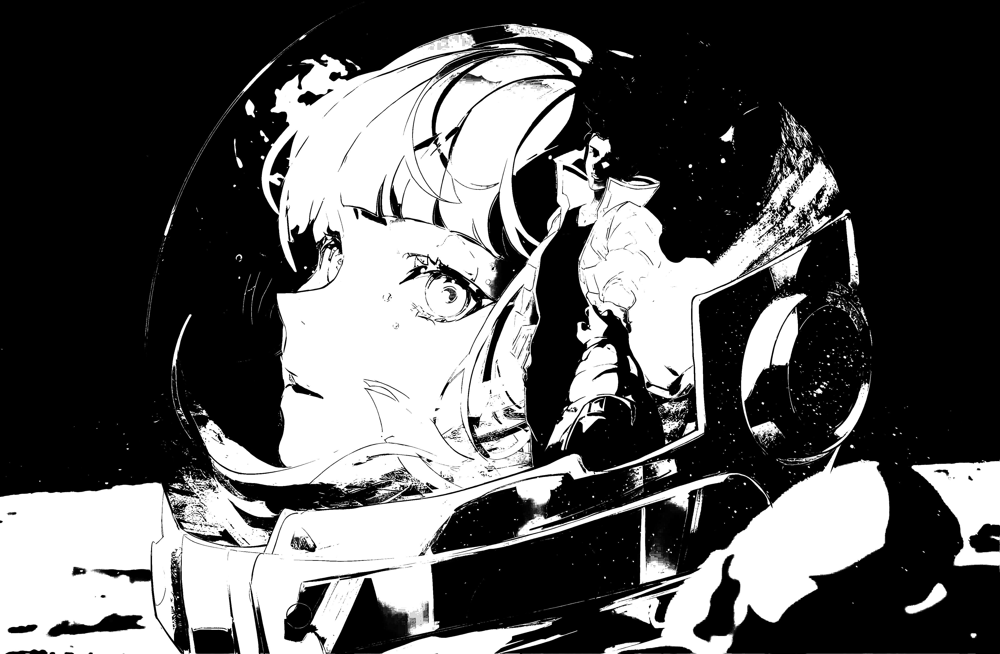

In [ ]:
g1 = cv2.GaussianBlur(img[:,:,0],(5,5),sigmaC)
g2 = cv2.GaussianBlur(img[:,:,0],(5,5),sigmaC * 1.6)

res = (1 + tau)* (g1 * 100.0) - (tau * (g2 * 100.0))

for x in range(img.shape[0]):
  for y in range(img.shape[1]):
    res[x,y] = 1 if res[x,y] >= epsilon else 1 + np.tanh(theta * (res[x,y] - epsilon))

cv2_imshow(res * 255)

# Use Gaussian

### Original Image

In [308]:
image_path = "/content/364698731_dccea2f3fa_o.jpg"

In [318]:
#### VARIABLES ###
sigmaC = 3.3
sigmaE = 2.7
sigmaM = 4.2
sigmaA = 2.4
tau = 98.77
epsilon = 71.3
theta = 0.1

Threshold =2.0

sigma = 1 ## For Gradient Not part of DoG Variables

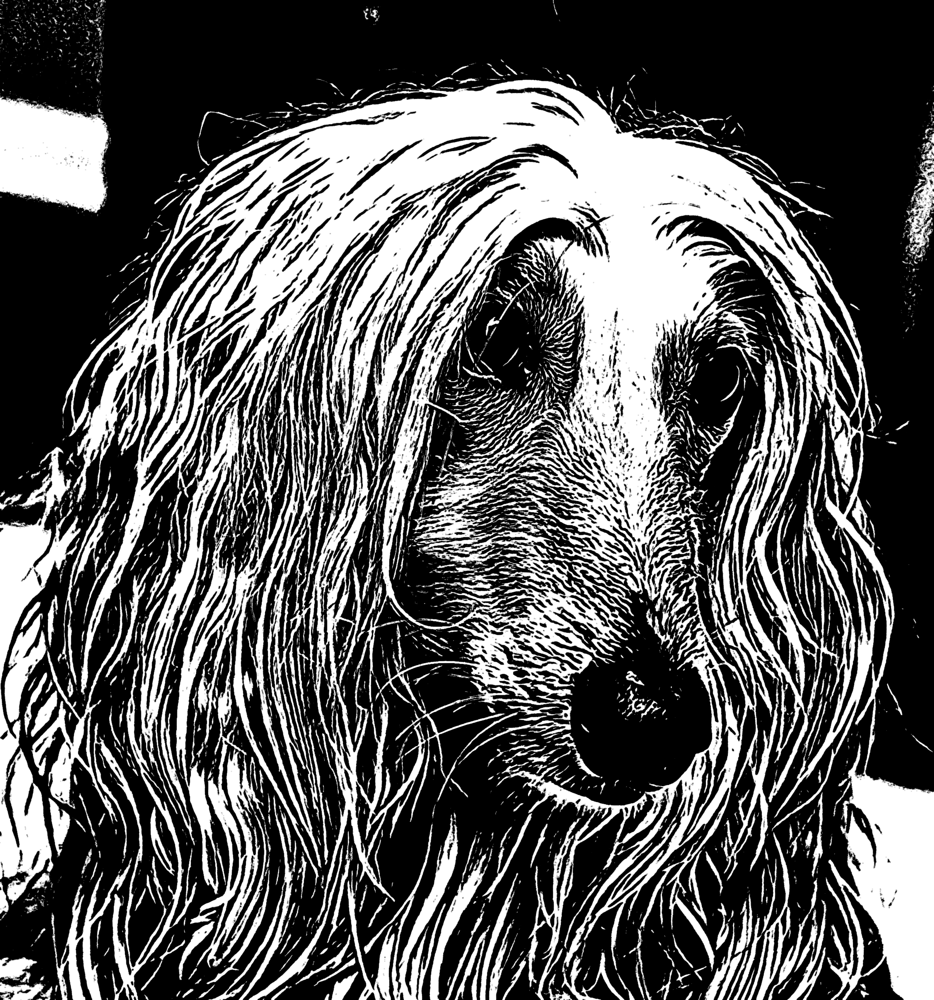

In [319]:
FDoG(image_path,4)

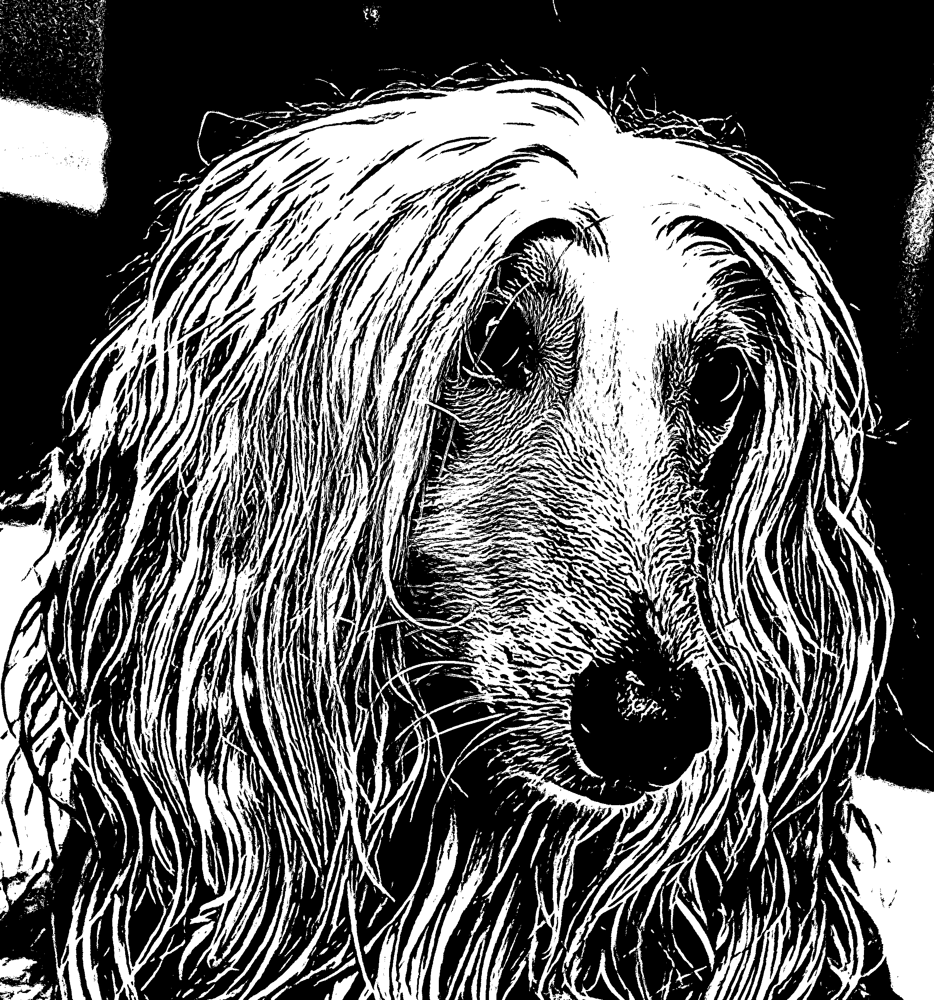

In [321]:
FDoG(image_path,4)

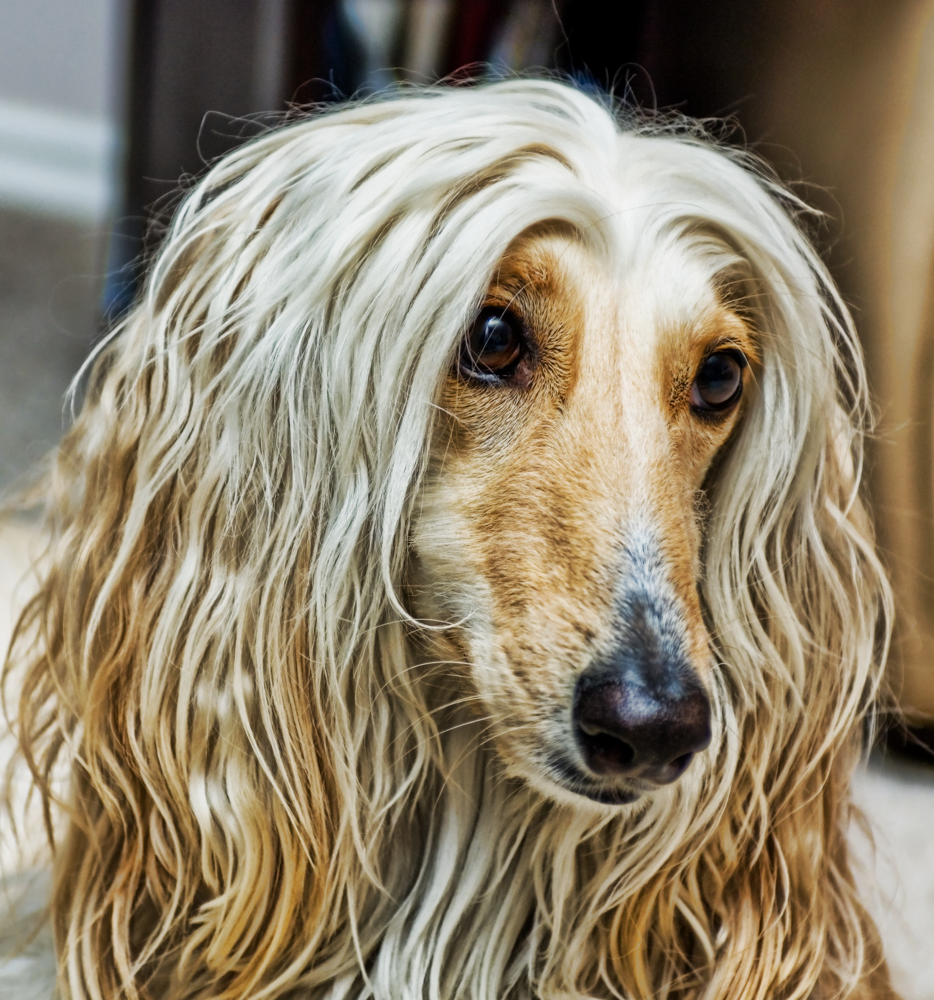

In [304]:
cv2_imshow(cv2.imread(image_path))

In [ ]:
img = cv2.imread("/content/lena.png")
img = cv2.cvtColor(img,cv2.COLOR_BGR2LAB).astype('float32')[:,:,0]
img = cv2.normalize(img, None, 0.0, 1.0, cv2.NORM_MINMAX) # Img.shape = 512*512 - img[0] height - img[1] width

In [ ]:
 img = np.floor(img *  (3-1) + 0.5) / (4-1)

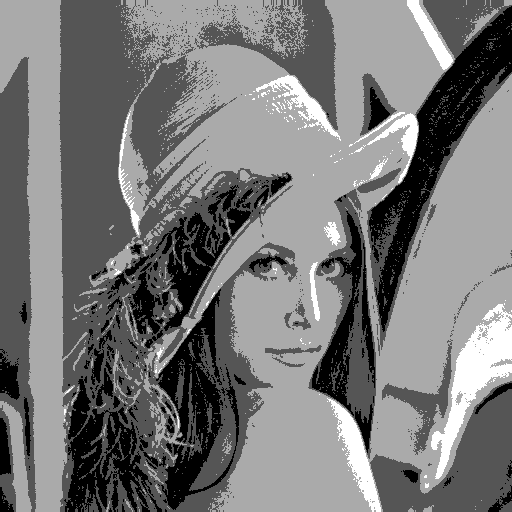

In [ ]:
cv2_imshow(img * 255)